## Importing Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from plotly.offline import init_notebook_mode, iplot 
import plotly.graph_objects as go
import plotly.offline as py
import plotly.express as px

In [ ]:
X_df = pd.read_csv("/content/drive/My Drive/ML Project/hackathon dataset.csv", header = None)
X_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0


In [ ]:
X_df.shape

(4240, 16)

##Understanding the Data

In [ ]:
pip install pandas-profiling==2.8.0

In [ ]:
import pandas_profiling as pp
pp.ProfileReport(X_df)

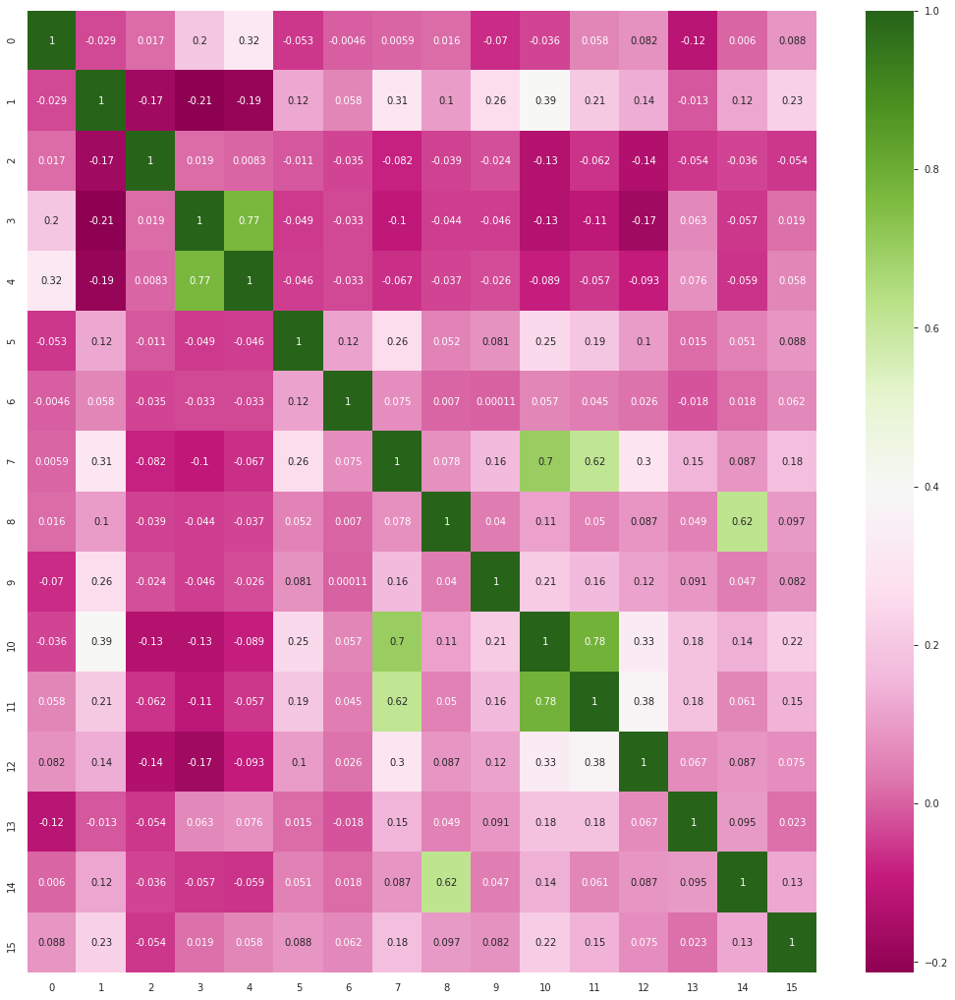

In [ ]:
plt.figure(figsize = (18,18))
sns.heatmap(X_df.corr(), annot = True, cmap = "PiYG")

plt.show()

##Missing Value Handling

Checking for missing values in the dataset

In [ ]:
print(X_df.isna().sum())
print(X_df.info)

0       0
1       0
2     105
3       0
4      29
5      53
6       0
7       0
8       0
9      50
10      0
11      0
12     19
13      1
14    388
15      0
dtype: int64
<bound method DataFrame.info of       0   1    2   3     4    5   ...     10    11     12    13     14  15
0      1  39  4.0   0   0.0  0.0  ...  106.0  70.0  26.97  80.0   77.0   0
1      0  46  2.0   0   0.0  0.0  ...  121.0  81.0  28.73  95.0   76.0   0
2      1  48  1.0   1  20.0  0.0  ...  127.5  80.0  25.34  75.0   70.0   0
3      0  61  3.0   1  30.0  0.0  ...  150.0  95.0  28.58  65.0  103.0   1
4      0  46  3.0   1  23.0  0.0  ...  130.0  84.0  23.10  85.0   85.0   0
...   ..  ..  ...  ..   ...  ...  ...    ...   ...    ...   ...    ...  ..
4235   0  48  2.0   1  20.0  NaN  ...  131.0  72.0  22.00  84.0   86.0   0
4236   0  44  1.0   1  15.0  0.0  ...  126.5  87.0  19.16  86.0    NaN   0
4237   0  52  2.0   0   0.0  0.0  ...  133.5  83.0  21.47  80.0  107.0   0
4238   1  40  3.0   0   0.0  0.0  ...  141.0 

We drop the rows with the missing values from our dataset, as upon comparison with kNN imputation, the results were varying and were on the lower end

In [ ]:
X_df = X_df.dropna()

In [ ]:
print(X_df.isna().sum())
X_df[15].value_counts()

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
13    0
14    0
15    0
dtype: int64


0    3101
1     557
Name: 15, dtype: int64

In [ ]:
y_df = X_df[15]

In [ ]:
X_df = X_df.drop(15,axis=1)

In [ ]:
X_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4233,1,50,1.0,1,1.0,0.0,0,1,0,313.0,179.0,92.0,25.97,66.0,86.0
4234,1,51,3.0,1,43.0,0.0,0,0,0,207.0,126.5,80.0,19.71,65.0,68.0
4237,0,52,2.0,0,0.0,0.0,0,0,0,269.0,133.5,83.0,21.47,80.0,107.0
4238,1,40,3.0,0,0.0,0.0,0,1,0,185.0,141.0,98.0,25.60,67.0,72.0


##Imbalanced Data Handling

To handle the imbalanced data, we apply SMOTE NC i.e. SMOTE for categorical features. This will oversample the observations and create a dataset which has equal values of both target classes 0 and 1.

We did not scale this data as the range for the data was varying between single to triple digits i.e. at most the values were in 3 digits and the on the lower end, on a single digit or two digits. Hence, there wasn't much variation and it required no scaling.

In [ ]:
# import library
from imblearn.over_sampling import SMOTENC
from collections import Counter

# fit predictor and target variable
x_smote, y_smote = SMOTENC(categorical_features=[0,2,3,5,6,7,8]).fit_resample(X_df, y_df)

x_df_new = pd.DataFrame(x_smote)
y_df_new = pd.DataFrame(y_smote)
print(x_df_new.shape)
print(y_df_new.shape)
y_df_new = y_df_new.rename(columns={0: 15})
print(y_df_new.head())

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.



(6202, 15)
(6202, 1)
   15
0   0
1   0
2   0
3   1
4   0


In [ ]:
frames=[x_df_new, y_df_new]
result = pd.concat(frames,axis=1)
result.shape

(6202, 16)

In [ ]:
result.to_csv("/content/drive/My Drive/ML Project/hackathon2_balanced.csv", encoding='utf-8')

In [ ]:
result.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,1.0,39.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0.0,46.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1.0,48.0,1.0,1.0,20.0,0.0,0.0,0.0,0.0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0.0,61.0,3.0,1.0,30.0,0.0,0.0,1.0,0.0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0.0,46.0,3.0,1.0,23.0,0.0,0.0,0.0,0.0,285.0,130.0,84.0,23.10,85.0,85.0,0


##Understanding the Balanced Dataset

In [ ]:
pp.ProfileReport(result)

##Data Visualizations

Visualising the heatmap for finding out correlation between different categories

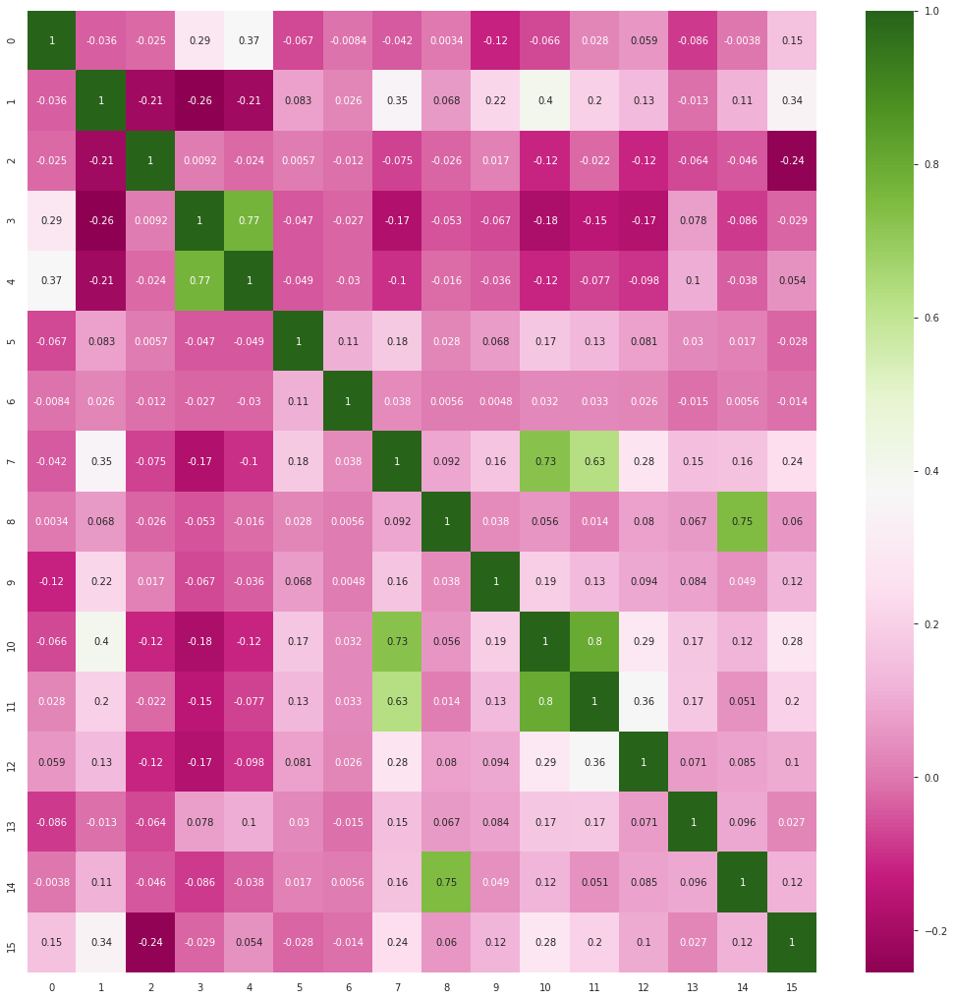

In [ ]:
plt.figure(figsize = (18,18))
sns.heatmap(result.corr(), annot = True, cmap = "PiYG")

plt.show()

Visualising the boxplots for seeing the variation in data for outliers (only for continuous valued fetaures)

In [ ]:
cols = ['1','4','9','10','11','12','13','14']
for i in cols:
  fig = px.box(result, x='15', y= i, notched=True)
  fig.show()

##Outlier Handling

For handling outliers, there were 2 choices for us:

1. Keep the outliers
2. Discard the outliers which are beyond 1.5 times the Inter Quartile Range

Since there was no way to analyse or know the feature names, or the domain of the data that we were dealing with, simply keeping the outliers because they were "naturally varying" values would mean a lower accuracy and poor model fitting.

Therefore, we decided to go with the second option wherein we removed the outlier data points and got a much better score in terms of accuracy and model fitting. This was however, not an ideal approach if the domain we had been dealing with was known to us. To make models fit statistically, and outlier removal would always have benefitted but not if those values were not outliers but proper data points.

**In the absence of the feature names and the description of the dataset we were handling, there was absolutely no way to decide whether the outliers were natural or extremely varying. Therefore, we decided to drop all of them to maintain a uniformity in our dataset.**

In [ ]:
result1 = result
result1.shape

In [ ]:
for variable in result.columns:
    #calculate the IQR
    IQR = result[variable].quantile(0.75) - result[variable].quantile(0.25)
    
    #calculate the boundries
    lower = result[variable].quantile(0.25) - (IQR * 1.5)
    upper = result[variable].quantile(0.75) + (IQR * 1.5)
    
    # find the outliers
    outliers = np.where(result[variable] > upper, True, np.where(result[variable] < lower, True, False))
    
    # remove outliers from data.
    result = result.loc[~(outliers), ]   

print(result.shape)

(4630, 16)


In [ ]:
result.head()

In [ ]:
result.to_csv("/content/drive/My Drive/ML Project/preprocessed_dataset.csv", encoding='utf-8')

Plotting the boxplots again, we can see that the outliers have certainly been removed. 

In [ ]:
cols = ['1','4','9','10','11','12','13','14']
for i in cols:
  fig = px.box(result, x='15', y= i, notched=True)
  fig.show()

##Feature Selection

To get an idea about which features mattered the most, we performed Forward Feature Selection technique, for all the features, using a Random Forest Classifier. 

We got the following results wherein upto 5 features were comfortably capturing the dataset all the while giving great good accuracy scores.

Since the drop between 5 and 6 was considerable and since 5 actually captured one more feature than 6, we decided to go with top 5 features for applying our model.

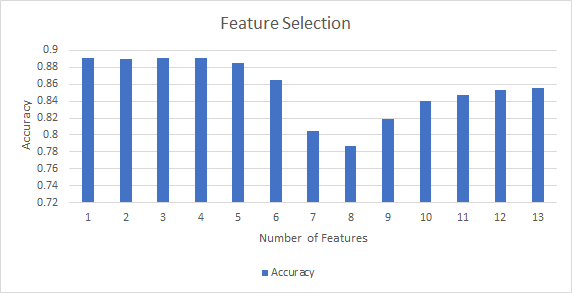

In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score as acc
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.metrics import accuracy_score

y = result[15]
X = result.drop(15,axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

y_train = y_train.ravel()
y_test = y_test.ravel()

print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)
clf = RandomForestClassifier(n_estimators=100, n_jobs=-1)

for i in range(1,15):
  sfs1 = sfs(clf,
           k_features=i,
           forward=True,
           floating=False,
           verbose=2,
           scoring='accuracy',
           cv=5)

  # Perform SFFS
  sfs1 = sfs1.fit(X_train, y_train)
  feat_cols = list(sfs1.k_feature_idx_)
  print(feat_cols)

##Summarizing the Preprocessing

Given that the dataset's domain was not known to us, we had to manually interpret the results of trying and testing out different strategies for preprocessing the dataset. We analysed the dataset for the following combinations carried out during preprocessing.

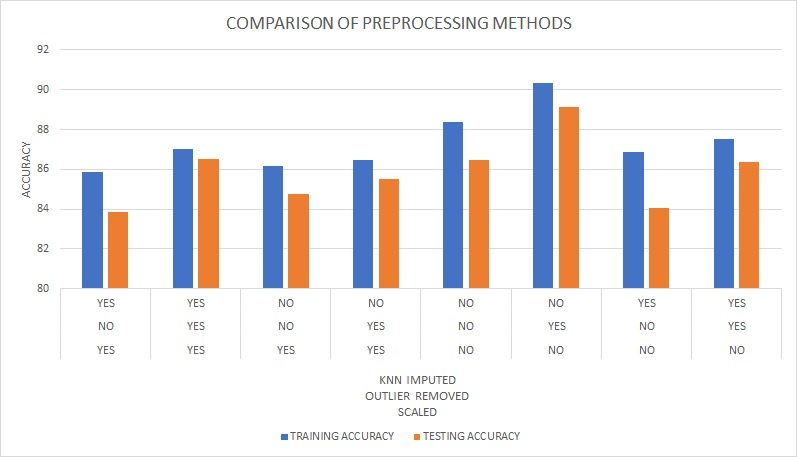

##Base Model Application

To apply our base model, we chose Decision Tree Classifier as the problem given to us was a classification problem for predicting the outcome variable between 0 and 1.

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score

In [ ]:
def evaluatealgo(y_predict, y_test):
  print("Accuracy:",accuracy_score(y_predict, y_test)*100)
  print(classification_report(y_predict, y_test))
  print(confusion_matrix(y_predict, y_test))
  print("F1 score:",f1_score(y_predict,y_test))
  fpr, tpr, _ = roc_curve(y_test, y_predict)
  auc = roc_auc_score(y_test, y_predict)
  plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
  plt.legend(loc=4)
  plt.box(False)
  plt.title ('ROC CURVE')
  plt.show()

  print(f"The score for the AUC ROC Curve is: {round(auc,3)*100}%")

In [ ]:
from sklearn.model_selection import train_test_split
y = result[15]
frames=[result[1],result[5],result[6],result[7],result[8]]
X = pd.concat(frames,axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

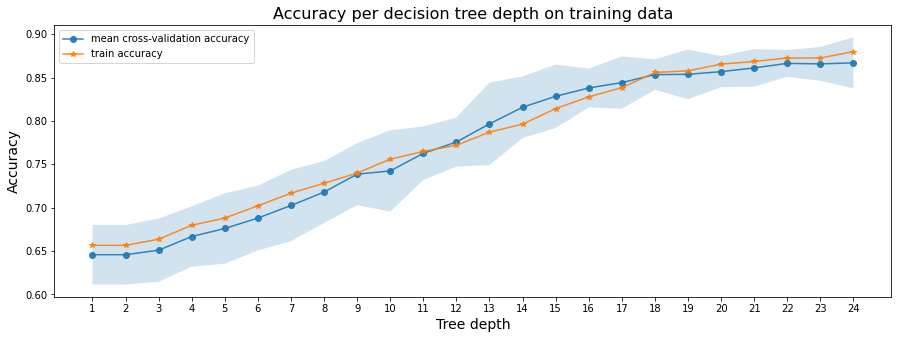

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
import numpy as np
import matplotlib.pyplot as plt


# function for fitting trees of various depths on the training data using cross-validation
def run_cross_validation_on_trees(X, y, tree_depths, cv=5, scoring='accuracy'):
    cv_scores_list = []
    cv_scores_std = []
    cv_scores_mean = []
    accuracy_scores = []
    for depth in tree_depths:
        tree_model = DecisionTreeClassifier(max_depth=depth)
        cv_scores = cross_val_score(tree_model, X, y, cv=cv, scoring=scoring)
        cv_scores_list.append(cv_scores)
        cv_scores_mean.append(cv_scores.mean())
        cv_scores_std.append(cv_scores.std())
        accuracy_scores.append(tree_model.fit(X, y).score(X, y))
    cv_scores_mean = np.array(cv_scores_mean)
    cv_scores_std = np.array(cv_scores_std)
    accuracy_scores = np.array(accuracy_scores)
    return cv_scores_mean, cv_scores_std, accuracy_scores
  
# function for plotting cross-validation results
def plot_cross_validation_on_trees(depths, cv_scores_mean, cv_scores_std, accuracy_scores, title):
    fig, ax = plt.subplots(1,1, figsize=(15,5))
    ax.plot(depths, cv_scores_mean, '-o', label='mean cross-validation accuracy', alpha=0.9)
    ax.fill_between(depths, cv_scores_mean-2*cv_scores_std, cv_scores_mean+2*cv_scores_std, alpha=0.2)
    ylim = plt.ylim()
    ax.plot(depths, accuracy_scores, '-*', label='train accuracy', alpha=0.9)
    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Tree depth', fontsize=14)
    ax.set_ylabel('Accuracy', fontsize=14)
    ax.set_ylim(ylim)
    ax.set_xticks(depths)
    ax.legend()

# fitting trees of depth 1 to 24
sm_tree_depths = range(1,25)
sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores = run_cross_validation_on_trees(X_train, y_train, sm_tree_depths)

# plotting accuracy
plot_cross_validation_on_trees(sm_tree_depths, sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores, 
                               'Accuracy per decision tree depth on training data')


In [ ]:
idx_max = sm_cv_scores_mean.argmax()
sm_best_tree_depth = sm_tree_depths[idx_max]
sm_best_tree_cv_score = sm_cv_scores_mean[idx_max]
sm_best_tree_cv_score_std = sm_cv_scores_std[idx_max]
print('The depth-{} tree achieves the best mean cross-validation accuracy {} +/- {}% on training dataset'.format(
      sm_best_tree_depth, round(sm_best_tree_cv_score*100,5), round(sm_best_tree_cv_score_std*100, 5)))

The depth-24 tree achieves the best mean cross-validation accuracy 86.69753 +/- 1.46857% on training dataset


Accuracy: 86.03311735061196
              precision    recall  f1-score   support

           0       0.92      0.84      0.87       802
           1       0.80      0.89      0.84       587

    accuracy                           0.86      1389
   macro avg       0.86      0.86      0.86      1389
weighted avg       0.87      0.86      0.86      1389

[[670 132]
 [ 62 525]]
F1 score: 0.8440514469453377


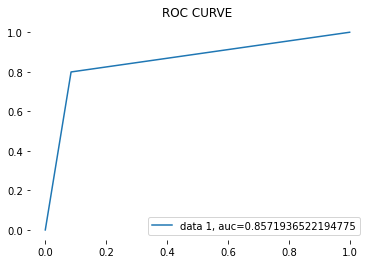

The score for the AUC ROC Curve is: 85.7%
Single tree depth:  24
Accuracy, Training Set:  87.99383 %
Accuracy, Test Set:  86.03312 %


In [ ]:
# function for training and evaluating a tree
def run_single_tree(X_train, y_train, X_test, y_test, depth):
    model = DecisionTreeClassifier(max_depth=depth).fit(X_train, y_train)
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = model.score(X_test, y_test)
    pred = model.predict(X_test)
    evaluatealgo(pred,y_test)
    print('Single tree depth: ', depth)
    print('Accuracy, Training Set: ', round(accuracy_train*100,5), '%')
    print('Accuracy, Test Set: ', round(accuracy_test*100,5), '%')
    return accuracy_train, accuracy_test
  

# train and evaluate a depth tree
sm_best_tree_accuracy_train, sm_best_tree_accuracy_test = run_single_tree(X_train, y_train, 
                                                                          X_test, y_test, 
                                                                          sm_best_tree_depth)


##Applying Random Forest Model 

After applying our model, we did get a accuracy score of 85%. To further try out to increase this score on an ensemble model, we implemented ensemble models on the dataset. We have implemented Random Forest as well as Bagging Classifier on our dataset to solve the problem.

In [ ]:
data = pd.read_csv("/content/drive/My Drive/ML Project/preprocessed_dataset.csv")
X = data.drop(["0","2","3","4","9","10","11","12","13","14","15"], axis = 1)
y = data["15"]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [ ]:
from math import sqrt 
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import mean_squared_error, r2_score

Accuracy: 90.2315484804631
              precision    recall  f1-score   support

           0       0.95      0.87      0.91       797
           1       0.85      0.94      0.89       585

    accuracy                           0.90      1382
   macro avg       0.90      0.91      0.90      1382
weighted avg       0.91      0.90      0.90      1382

[[697 100]
 [ 35 550]]
F1 score: 0.8906882591093118


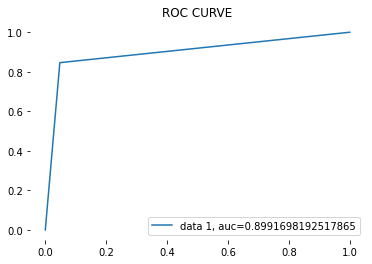

The score for the AUC ROC Curve is: 89.9%


In [ ]:
from sklearn.ensemble import RandomForestClassifier


clf=RandomForestClassifier(bootstrap = False,
                          max_depth= 100,
                          max_features= 'auto',
                          min_samples_leaf = 3,
                          min_samples_split = 7,
                          n_estimators = 500)


clf.fit(X_train,y_train)
y_pred=clf.predict(X_test)
evaluatealgo(y_pred,y_test)

##Hyperparameter Tuning on Random Forest

In [ ]:
# Number of trees in random forest
n_estimators = [50,75,100]
# Number of features to consider at every split
max_features = ['auto']
# Maximum number of levels in tree
max_depth = [50,70,90]
# Minimum number of samples required to split a node
min_samples_split = [0.5,1,2]
# Minimum number of samples required at each leaf node
min_samples_leaf = [3,5,7]
# Method of selecting samples for training each tree
bootstrap = [True, False]
max_samples = [0.2,0.5]

In [ ]:
param_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
               'max_samples': max_samples,
               'criterion':['gini','entropy']}

In [ ]:
from sklearn.model_selection import GridSearchCV
rf_Grid = GridSearchCV(estimator = clf, param_grid = param_grid, cv = 2, verbose=2, n_jobs = -1)

In [ ]:
rf_Grid.fit(X_train, y_train)

Fitting 2 folds for each of 648 candidates, totalling 1296 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done 361 tasks      | elapsed:   32.0s
[Parallel(n_jobs=-1)]: Done 644 tasks      | elapsed:   56.2s
[Parallel(n_jobs=-1)]: Done 1009 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 1296 out of 1296 | elapsed:  2.0min finished


GridSearchCV(cv=2, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=100,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=3,
                                              min_samples_split=7,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=500, n_jobs=None,...
                                              warm_start=False),
             iid='deprecated', n_jobs=-1,
    

In [ ]:
rf_Grid.best_params_

{'bootstrap': False,
 'criterion': 'entropy',
 'max_depth': 50,
 'max_features': 'auto',
 'max_samples': 0.5,
 'min_samples_leaf': 7,
 'min_samples_split': 0.5,
 'n_estimators': 50}

Accuracy for Random Forest on CV data:  92.32995658465991
Accuracy: 92.32995658465991
              precision    recall  f1-score   support

           0       1.00      0.87      0.93       838
           1       0.84      1.00      0.91       544

    accuracy                           0.92      1382
   macro avg       0.92      0.94      0.92      1382
weighted avg       0.94      0.92      0.92      1382

[[732 106]
 [  0 544]]
F1 score: 0.9112227805695142


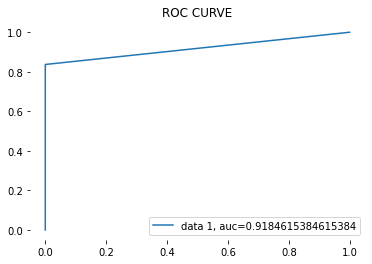

The score for the AUC ROC Curve is: 91.8%


In [ ]:
from sklearn.metrics import accuracy_score
rfc1 = RandomForestClassifier(random_state=42,
                              max_features='auto', 
                              n_estimators= 50,
                              max_samples = 0.5,
                              min_samples_leaf = 7,
                              min_samples_split = 0.5,
                              max_depth= 50, 
                              criterion='entropy',
                              bootstrap= False,
                              )
rfc1.fit(X_train, y_train)
pred=rfc1.predict(X_test)
print("Accuracy for Random Forest on CV data: ",accuracy_score(y_test,pred)*100)
evaluatealgo(pred,y_test)

##Applying Bagging Classifier

0.9008683068017366
BC:
Accuracy: 90.08683068017366
              precision    recall  f1-score   support

           0       0.94      0.88      0.91       785
           1       0.85      0.93      0.89       597

    accuracy                           0.90      1382
   macro avg       0.90      0.90      0.90      1382
weighted avg       0.90      0.90      0.90      1382

[[690  95]
 [ 42 555]]
F1 score: 0.8901363271852446


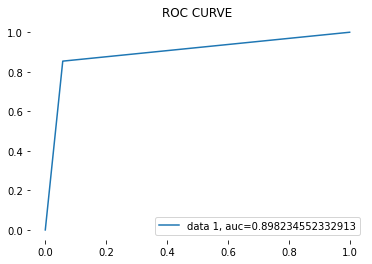

The score for the AUC ROC Curve is: 89.8%


In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn import tree
model = BaggingClassifier(tree.DecisionTreeClassifier(random_state=1))
model.fit(X_train, y_train)
print(model.score(X_test,y_test))
BC_prediction = model.predict(X_test)

print("BC:")
evaluatealgo(BC_prediction,y_test)

##Hyperparameter Tuning on Bagging Classifier

BC:
Accuracy: 89.72503617945007
              precision    recall  f1-score   support

           0       0.94      0.87      0.91       790
           1       0.85      0.93      0.89       592

    accuracy                           0.90      1382
   macro avg       0.89      0.90      0.90      1382
weighted avg       0.90      0.90      0.90      1382

[[690 100]
 [ 42 550]]
F1 score: 0.8856682769726248


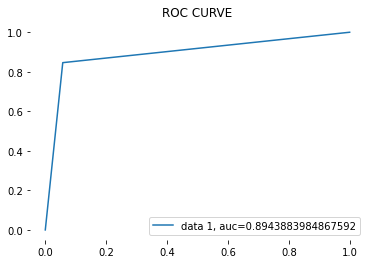

The score for the AUC ROC Curve is: 89.4%
Best: 0.904030 using {'n_estimators': 10}
0.904030 (0.013156) with: {'n_estimators': 10}
0.901339 (0.012817) with: {'n_estimators': 100}
0.900717 (0.012253) with: {'n_estimators': 1000}


In [ ]:
# example of grid searching key hyperparameters for BaggingClassifier
from sklearn.datasets import make_blobs
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier

# define models and parameters
model = BaggingClassifier()
n_estimators = [10, 100, 1000]
# define grid search
grid = dict(n_estimators=n_estimators)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train, y_train)
prediction = grid_result.predict(X_test)

print("BC:")
evaluatealgo(prediction,y_test)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

##Applying XGBoost

Best Hyper Parameters:
 {'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 6, 'min_child_weight': 11, 'missing': -999, 'n_estimators': 5, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 1337, 'silent': 1, 'subsample': 0.8}
XGB:
Accuracy: 92.25759768451519
              precision    recall  f1-score   support

           0       1.00      0.87      0.93       839
           1       0.84      1.00      0.91       543

    accuracy                           0.92      1382
   macro avg       0.92      0.94      0.92      1382
weighted avg       0.94      0.92      0.92      1382

[[732 107]
 [  0 543]]
F1 score: 0.9103101424979044


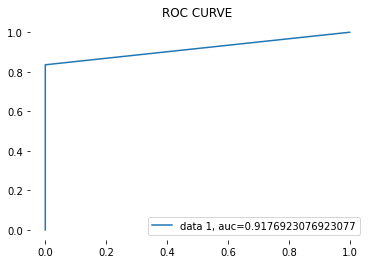

The score for the AUC ROC Curve is: 91.8%


In [ ]:
from sklearn.model_selection import GridSearchCV
import xgboost as xgb
#making the instance
model=xgb.XGBClassifier(learning_rate=0.02, n_estimators=600, objective='binary:logistic',
                    silent=True, nthread=1)
#hyper parameters set
params = {'nthread':[4], #when use hyperthread, xgboost may become slower
      'objective':['binary:logistic'],
      'learning_rate': [0.05], #so called eta value
      'max_depth': [6],
      'min_child_weight': [11],
      'silent': [1],
      'subsample': [0.8],
      'colsample_bytree': [0.7],
      'n_estimators': [5], #number of trees, change it to 1000 for better results
      'missing':[-999],
      'seed': [1337]}
#Making models with hyper parameters sets
model1 = GridSearchCV(model, param_grid=params, n_jobs=1,cv = 10)
#Learning
model1.fit(X_train,y_train)
#The best hyper parameters set
print("Best Hyper Parameters:\n",model1.best_params_)
#Prediction
prediction=model1.predict(X_test)
print("XGB:")
evaluatealgo(prediction,y_test)

##Comparing the models

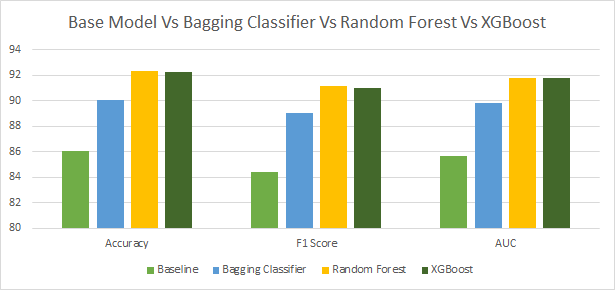

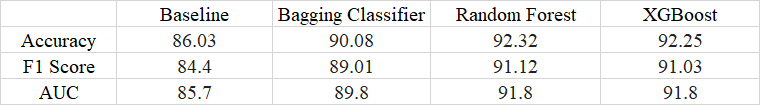

##Bias and Variance Check

In [ ]:
%pip install mlxtend --upgrade

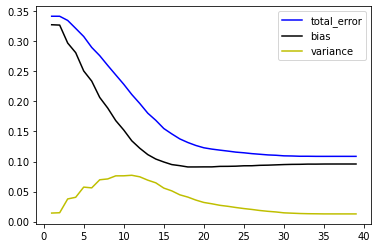

In [ ]:
from mlxtend.evaluate import bias_variance_decomp
bias, var, error = [], [], []
for k in range(1, 40):
  clf = DecisionTreeClassifier(max_depth=k)
  X_t = X_train.to_numpy()
  y_t = y_train.to_numpy()
  X_t1 = X_test.to_numpy()
  y_t1 = y_test.to_numpy()
  avg_expected_loss, avg_bias, avg_var  = avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(clf, X_t, y_t, X_t1, y_t1, loss='mse', random_seed=123)
  bias.append(avg_bias)
  var.append(avg_var)
  error.append(avg_expected_loss)
plt.plot(range(1,40), error, 'b', label = 'total_error')
plt.plot(range(1,40), bias, 'k', label = 'bias')
plt.plot(range(1,40), var, 'y', label = 'variance')
plt.legend()

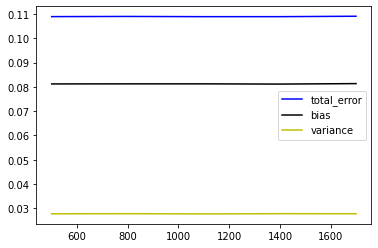

In [ ]:
from mlxtend.evaluate import bias_variance_decomp
from sklearn.ensemble import BaggingClassifier
bias, var, error = [], [], []
for k in range(500, 2000,300):
  clf = BaggingClassifier(n_estimators=k)
  X_t = X_train.to_numpy()
  y_t = y_train.to_numpy()
  X_t1 = X_test.to_numpy()
  y_t1 = y_test.to_numpy()
  avg_expected_loss, avg_bias, avg_var  = avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(clf, X_t, y_t, X_t1, y_t1, loss='mse', random_seed=123)
  bias.append(avg_bias)
  var.append(avg_var)
  error.append(avg_expected_loss)
plt.plot(range(500,2000,300), error, 'b', label = 'total_error')
plt.plot(range(500,2000,300), bias, 'k', label = 'bias')
plt.plot(range(500,2000,300), var, 'y', label = 'variance')
plt.legend()